## This notebook looks at the data and generates the time series discharge data using rating curve.

### Importing necessary modules

In [171]:
import os

BASE_DIR = os.path.dirname(os.path.dirname(os.path.abspath('__file__')))
print(f'BASE_DIR: {BASE_DIR}')

from IPython.display import display, HTML

from datetime import datetime
from pathlib import Path

import json, pickle

import pandas as pd
import numpy as np
import pwlf
import pytz


from sklearn import svm
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split

from statsmodels.sandbox.regression.predstd import wls_prediction_std
from statsmodels.stats.outliers_influence import summary_table
import statsmodels.api as sm

%matplotlib inline

from matplotlib import pyplot as plt, gridspec
import matplotlib.dates as mdates

# custom
import sys

# Change this in server
sys.path.insert(0, f'{BASE_DIR}/scripts')
import stats
# import utils
import cluster_utils


BASE_DIR: /Users/bbhandar/UAH/Thesis/Bhandari_Thesis/2_spt_bias_correction


### List of stations that we will (possibly) bias-correct

In [172]:
stations = [
    'Battambang', 'Chaktomuk', 'Kg_Thmar', 'Koh_Khel', 'Kompong_Cham', 'Kompong_Chen', 'Kompong_Kdei',
    'Kompong_Thom', 'Kratie', 'Lumphat', 'Neak_Luong', 'Siempang', 'Sisophon', 'Stung_Treng', 'Voeun_Sai',
]


In [173]:
start_date_1 = '2000-01-01'
end_date_1 = '2003-12-31'
full_dates_1 = pd.date_range(datetime.strptime(start_date_1, '%Y-%m-%d'),
                           datetime.strptime(end_date_1, '%Y-%m-%d'), freq='d') \
    .strftime('%Y-%m-%d').tolist()

start_date_2 = '2005-01-01'
end_date_2 = '2020-12-31'
full_dates_2 = pd.date_range(datetime.strptime(start_date_2, '%Y-%m-%d'),
                           datetime.strptime(end_date_2, '%Y-%m-%d'), freq='d') \
    .strftime('%Y-%m-%d').tolist()

full_dates = full_dates_1 + full_dates_2
# idx = pd.DatetimeIndex(pd.date_range(start=start_date, end=end_date, freq='1D'))

start_date = '2000-01-01'
end_date = '2020-12-31'
full_dates_all = pd.date_range(datetime.strptime(start_date, '%Y-%m-%d'), datetime.strptime(end_date, '%Y-%m-%d'), freq='d') \
                   .strftime('%Y-%m-%d').tolist()


font_size = 25

len(full_dates), len(full_dates_all)


(7305, 7671)

In [174]:
data_path = f'{BASE_DIR}'

### How many timeperiod are missing in each stations?

---------------------- Station: Battambang -----------------------
len data: 6397
Missing len: 908
---------------------- Station: Chaktomuk -----------------------
len data: 6563
Missing len: 742
---------------------- Station: Kg_Thmar -----------------------
len data: 7090
Missing len: 215
---------------------- Station: Koh_Khel -----------------------
len data: 7305
Missing len: 0
---------------------- Station: Kompong_Cham -----------------------
len data: 7305
Missing len: 0
---------------------- Station: Kompong_Chen -----------------------
len data: 6809
Missing len: 496
---------------------- Station: Kompong_Kdei -----------------------
len data: 6716
Missing len: 589
---------------------- Station: Kompong_Thom -----------------------
len data: 6400
Missing len: 905
---------------------- Station: Kratie -----------------------
len data: 7305
Missing len: 0
---------------------- Station: Lumphat -----------------------
len data: 6876
Missing len: 429
--------------------

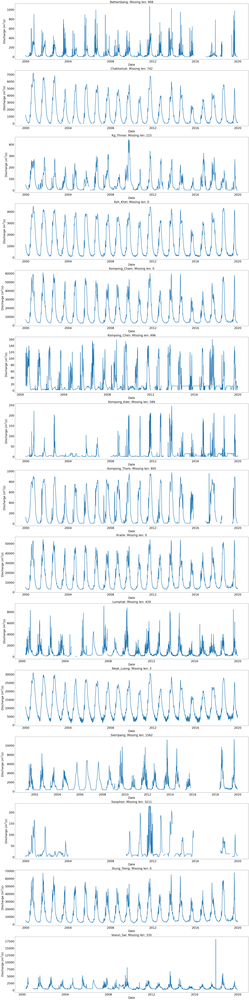

In [102]:
fig, ax = plt.subplots(len(stations), 1, figsize=(len(stations) * 2, len(stations) * 8))
missing_dates_existing = {}

start_date = '2000-01-01'
end_date = '2019-12-31'
full_dates = pd.date_range(datetime.strptime(start_date, '%Y-%m-%d'),
                           datetime.strptime(end_date, '%Y-%m-%d'), freq='d') \
    .strftime('%Y-%m-%d').tolist()

for i, station in enumerate(stations):
    # print(f'-----------------------------------------------------------------')
    print(f'---------------------- Station: {station} -----------------------')
    # print(f'-----------------------------------------------------------------')
    _df = pd.read_csv(f'{data_path}/training_data_metereo/{station}.csv', header=0, index_col='datetime')
    _df = _df.drop(['system:index', 'name', '.geo', 'stage'], axis=1)
    _df.index = pd.to_datetime(_df.index)
    _df = _df.sort_index()
    _df = _df.loc[start_date: end_date]

    print(f'len data: {len(_df)}')
    missing_len = len(full_dates) - len(_df.observation)
    print(f'Missing len: {missing_len}')

    idx = pd.DatetimeIndex(pd.date_range(start=datetime.strptime(start_date, '%Y-%m-%d'), end=datetime.strptime(end_date, '%Y-%m-%d'), freq='1D'))
    df = _df.reindex(idx, fill_value=np.nan)

    assert(df.observation.isnull().sum() == len(full_dates) - len(_df.observation))

    ax[i].plot(df.index, df.observation, lw=3, label='Observation')
    ax[i].set_title(f'{station}: Missing len: {missing_len}', fontsize=font_size)
    ax[i].set_xlabel('Date', fontsize=font_size)
    ax[i].set_ylabel('Discharge ($m^3/s$)', fontsize=font_size)
    ax[i].tick_params(axis='both', labelsize=font_size)

    missing_dates_existing[station] = missing_len

plt.tight_layout()
plt.show()

### Check these stations for the new dataset obtained from MRC

#### Stage

-----------------------------------------------------------------
---------------------- Station: Battambang -----------------------
-----------------------------------------------------------------
-----------------------------------------------------------------
-----------------------------------------------------------------
---------------------- Station: Chaktomuk -----------------------
-----------------------------------------------------------------
-----------------------------------------------------------------
-----------------------------------------------------------------
---------------------- Station: Kg_Thmar -----------------------
-----------------------------------------------------------------
-----------------------------------------------------------------
-----------------------------------------------------------------
---------------------- Station: Koh_Khel -----------------------
-----------------------------------------------------------------
-----------

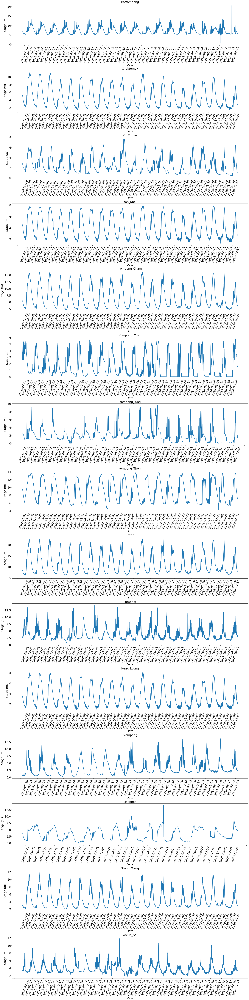

In [148]:
missing_dates_discharge_new = {}

fig, ax = plt.subplots(len(stations), 1, figsize=(len(stations) * 2, len(stations) * 8))

# start_date = '2000-01-01'
# end_date = '2019-12-31'
# full_dates = pd.date_range(datetime.strptime(start_date, '%Y-%m-%d'),
#                            datetime.strptime(end_date, '%Y-%m-%d'), freq='d') \
#     .strftime('%Y-%m-%d').tolist()

missing_dates_stage_new = {}

for i, station in enumerate(stations):
    print(f'-----------------------------------------------------------------')
    print(f'---------------------- Station: {station} -----------------------')
    print(f'-----------------------------------------------------------------')

    try:
        wl_manual = pd.read_csv(f'{data_path}/mrc20220714233804_formatted/water_level_manual_{station}.csv', header=0, index_col='Timestamp (UTC+07:00)')
        wl_manual = wl_manual.drop(['Country Code', 'Station Code', 'Parameter', 'Label', 'Approval Level', 'Observed or Estimated', 'Unit', 'Grade'], axis=1)
        wl_manual.index = pd.to_datetime(wl_manual.index)
        wl_manual.index.names = ['datetime']
        wl_manual = wl_manual.sort_index()
        wl_manual = wl_manual.resample('1D').mean()
        wl_manual.index = wl_manual.index.strftime('%Y-%m-%d')
    except FileNotFoundError:
        wl_manual = None

    try:
        wl_telemetry = pd.read_csv(f'{data_path}/mrc20220714233804_formatted/water_level_telemetry_{station}.csv', header=0, index_col='Timestamp (UTC+07:00)')
        wl_telemetry = wl_telemetry.drop(['Country Code', 'Station Code', 'Parameter', 'Label', 'Approval Level', 'Observed or Estimated', 'Unit', 'Grade'], axis=1)
        wl_telemetry.index = pd.to_datetime(wl_telemetry.index)
        wl_telemetry.index.names = ['datetime']
        wl_telemetry = wl_telemetry.sort_index()
        wl_telemetry = wl_telemetry.resample('1D').mean()
        wl_telemetry.index = wl_telemetry.index.strftime('%Y-%m-%d')
    except FileNotFoundError:
        wl_telemetry = None

    if wl_manual is not None and wl_telemetry is not None:
        df = wl_manual.copy()
        manual_datetime = wl_manual.index.tolist()
        telemetry_datetime = wl_telemetry.index.tolist()
        remaining_datetime = [datetime for datetime in telemetry_datetime if datetime not in manual_datetime]
        telemetry_df = wl_telemetry.loc[(wl_telemetry.index.isin(remaining_datetime)), :]
        df = pd.concat([df, telemetry_df], axis=0)
        df.Value = df.Value.round(2)
    elif wl_manual is None:
        df = wl_telemetry.copy()
        df.Value = df.Value.round(2)
    elif wl_telemetry is None:
        df = wl_manual.copy()
        df.Value = df.Value.round(2)

    df = df.dropna().sort_index()
    _df = df.copy()
    # _df1 = _df.loc[start_date_1: end_date_1].dropna().sort_index()
    # _df2 = _df.loc[start_date_2: end_date_2].dropna().sort_index()
    # df_filtered = pd.concat([_df1, _df2], axis=0)
    df_filtered = _df.loc[start_date: end_date].dropna().sort_index()

    # if station == 'Neak_Luong':
    #     md = [_date for _date in full_dates_all if _date not in df_filtered.index.tolist()]
    #     print(md)

    missing_len = len(full_dates_all) - len(df_filtered.Value)
    missing_dates_stage_new[station] = missing_len
    # print(f'{station} Filtered: {len(df_filtered)}')
    # print(f'{station} All: {len(df.Value)}')
    # print(f'{station} missing length: {missing_len}')

    Path(f'{data_path}/station_data/{station}').mkdir(parents=True, exist_ok=True)
    # df.to_csv(f'{data_path}/station_data/{station}/stage.csv', encoding='utf-8', index=True)
    # df_filtered.to_csv(f'{data_path}/station_data/{station}/filtered_stage.csv', encoding='utf-8', index=True)
    print(f'-----------------------------------------------------------------')

    ax[i].plot(df_filtered.index, df_filtered.Value, lw=3, label='Observation')
    ax[i].set_title(f'{station}', fontsize=font_size)
    ax[i].set_xlabel('Date', fontsize=font_size)
    ax[i].set_ylabel('Stage ($m$)', fontsize=font_size)
    ax[i].tick_params(axis='both', labelsize=font_size)
    ax[i].tick_params(axis='x', labelsize=font_size, rotation=70)
    ax[i].xaxis.set_major_locator(mdates.MonthLocator(interval=4))

plt.tight_layout()
plt.show()


In [149]:
missing_dates_stage_new

{'Battambang': 959,
 'Chaktomuk': 0,
 'Kg_Thmar': 211,
 'Koh_Khel': 0,
 'Kompong_Cham': 0,
 'Kompong_Chen': 496,
 'Kompong_Kdei': 595,
 'Kompong_Thom': 914,
 'Kratie': 0,
 'Lumphat': 564,
 'Neak_Luong': 3,
 'Siempang': 1588,
 'Sisophon': 3171,
 'Stung_Treng': 0,
 'Voeun_Sai': 466}

#### Discharge

-----------------------------------------------------------------
---------------------- Station: Battambang -----------------------
-----------------------------------------------------------------
-----------------------------------------------------------------
---------------------- Station: Chaktomuk -----------------------
-----------------------------------------------------------------
-----------------------------------------------------------------
---------------------- Station: Kg_Thmar -----------------------
-----------------------------------------------------------------
-----------------------------------------------------------------
---------------------- Station: Koh_Khel -----------------------
-----------------------------------------------------------------
-----------------------------------------------------------------
---------------------- Station: Kompong_Cham -----------------------
-----------------------------------------------------------------
--------

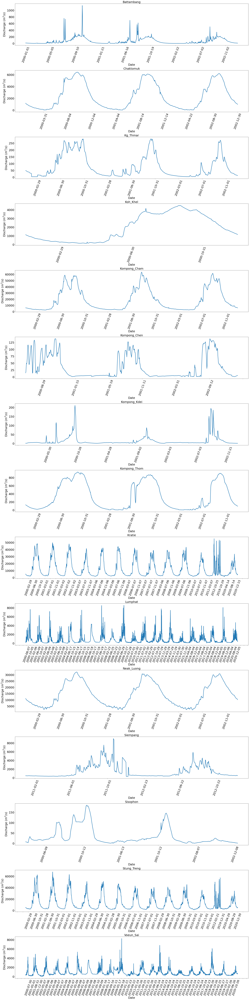

In [150]:
missing_dates_discharge_new = {}

fig, ax = plt.subplots(len(stations), 1, figsize=(len(stations) * 2, len(stations) * 8))

# start_date = '1990-01-01'
# end_date = '2019-12-31'
# full_dates = pd.date_range(datetime.strptime(start_date, '%Y-%m-%d'),
#                            datetime.strptime(end_date, '%Y-%m-%d'), freq='d') \
#     .strftime('%Y-%m-%d').tolist()

for i, station in enumerate(stations):
    print(f'-----------------------------------------------------------------')
    print(f'---------------------- Station: {station} -----------------------')
    print(f'-----------------------------------------------------------------')

    try:
        dis_calc = pd.read_csv(f'{data_path}/mrc20220714233804_formatted/discharge_calculated_{station}.csv', header=0, index_col='Timestamp (UTC+07:00)')
        dis_calc = dis_calc.drop(['Country Code', 'Station Code', 'Parameter', 'Label', 'Approval Level', 'Observed or Estimated', 'Unit', 'Grade'], axis=1)
        dis_calc.index = pd.to_datetime(dis_calc.index)
        # dis_calc = dis_calc.loc[start_date: end_date]
        dis_calc.index.names = ['datetime']
        dis_calc = dis_calc.sort_index()
        dis_calc = dis_calc.resample('1D').mean()
        dis_calc.index = dis_calc.index.strftime('%Y-%m-%d')
    except FileNotFoundError:
        dis_calc = None

    try:
        dis_dsmp = pd.read_csv(f'{data_path}/mrc20220714233804_formatted/discharge_dsmp_{station}.csv', header=0, index_col='Timestamp (UTC+07:00)')
        dis_dsmp = dis_dsmp.drop(['Country Code', 'Station Code', 'Parameter', 'Label', 'Approval Level', 'Observed or Estimated', 'Unit', 'Grade'], axis=1)
        dis_dsmp.index = pd.to_datetime(dis_dsmp.index)
        # dis_dsmp = dis_dsmp.loc[start_date: end_date]
        dis_dsmp.index.names = ['datetime']
        dis_dsmp = dis_dsmp.sort_index()
        dis_dsmp = dis_dsmp.resample('1D').mean()
        dis_dsmp.index = dis_dsmp.index.strftime('%Y-%m-%d')
    except FileNotFoundError:
        dis_dsmp = None

    if dis_calc is not None and dis_dsmp is not None:
        # print('both')
        df = dis_dsmp.copy()
        calc_datetime = dis_calc.index.tolist()
        dsmp_datetime = dis_dsmp.index.tolist()
        remaining_datetime = [datetime for datetime in calc_datetime if datetime not in dsmp_datetime]
        calc_df = dis_calc.loc[(dis_calc.index.isin(remaining_datetime)), :]
        df = pd.concat([df, calc_df], axis=0)
        df.Value = df.Value.round(2)
    elif dis_calc is None:
        df = dis_dsmp.copy()
        df.Value = df.Value.round(2)
    elif dis_dsmp is None:
        # print('dis_calc')
        df = dis_calc.copy()
        df.Value = df.Value.round(2)


    df = df.dropna().sort_index()
    _df = df.copy()
    # _df1 = _df.loc[start_date_1: end_date_1].dropna().sort_index()
    # _df2 = _df.loc[start_date_2: end_date_2].dropna().sort_index()
    # df_filtered = pd.concat([_df1, _df2], axis=0)
    df_filtered = _df.loc[start_date: end_date].dropna().sort_index()

    missing_len = len(full_dates_all) - len(df_filtered.Value)
    missing_dates_discharge_new[station] = missing_len
    # print(f'{station} Filtered: {len(df_filtered)}')
    # print(f'{station} All: {len(df.Value)}')
    # print(f'{station} missing length: {missing_len}')

    Path(f'{data_path}/station_data/{station}').mkdir(parents=True, exist_ok=True)
    df.to_csv(f'{data_path}/station_data/{station}/discharge.csv', encoding='utf-8', index=True)
    df_filtered.to_csv(f'{data_path}/station_data/{station}/filtered_discharge.csv', encoding='utf-8', index=True)
    # print(f'-----------------------------------------------------------------')

    ax[i].plot(df_filtered.index, df_filtered.Value, lw=3, label='Observation')
    ax[i].set_title(f'{station}', fontsize=font_size)
    ax[i].set_xlabel('Date', fontsize=font_size)
    ax[i].set_ylabel('Discharge ($m^3/s$)', fontsize=font_size)
    ax[i].tick_params(axis='both', labelsize=font_size)
    ax[i].tick_params(axis='x', rotation=70)
    ax[i].xaxis.set_major_locator(mdates.MonthLocator(interval=4))

plt.tight_layout()
plt.show()


#### Both Stage and Discharge

In [151]:
for station in stations:
    stage = pd.read_csv(f'{data_path}/station_data/{station}/stage.csv', header=0, index_col='datetime')
    stage.index = pd.to_datetime(stage.index)
    stage = stage.rename(columns={'Value': 'stage'})

    discharge = pd.read_csv(f'{data_path}/station_data/{station}/discharge.csv', header=0, index_col='datetime')
    discharge.index = pd.to_datetime(discharge.index)
    discharge = discharge.rename(columns={'Value': 'discharge'})

    df = pd.merge(stage, discharge, left_index=True, right_index=True, how='inner')
    df.index = pd.to_datetime(df.index)
    df = df.dropna().sort_index()
    df.to_csv(f'{data_path}/station_data/{station}/stage_discharge.csv', encoding='utf-8', index=True)

    filtered_stage = pd.read_csv(f'{data_path}/station_data/{station}/filtered_stage.csv', header=0, index_col='datetime')
    filtered_stage.index = pd.to_datetime(filtered_stage.index)
    filtered_stage = filtered_stage.rename(columns={'Value': 'stage'})

    filtered_discharge = pd.read_csv(f'{data_path}/station_data/{station}/filtered_discharge.csv', header=0, index_col='datetime')
    filtered_discharge.index = pd.to_datetime(filtered_discharge.index)
    filtered_discharge = filtered_discharge.rename(columns={'Value': 'discharge'})

    filtered_df = pd.merge(filtered_stage, filtered_discharge, left_index=True, right_index=True, how='inner')
    filtered_df.index = pd.to_datetime(filtered_df.index)
    filtered_df = df.dropna().sort_index()
    filtered_df.to_csv(f'{data_path}/station_data/{station}/filtered_stage_discharge.csv', encoding='utf-8', index=True)



### Rating Curve Generation

In [175]:
stations = [
    {
        'name': 'Battambang',
    },
    {
        'name': 'Chaktomuk',
    },
    {
        'name': 'Kg._Thmar',
    },
    {
        'name': 'Koh_Khel',
    },
    {
        'name': 'Kompong_Cham',
    },
    {
        'name': 'Kompong_Chen',
    },
    {
        'name': 'Kompong_Kdei',
    },
    {
        'name': 'Kompong_Thom',
    },
    {
        'name': 'Kratie',
    },
    {
        'name': 'Lumphat',
    },
    {
        'name': 'Neak_Luong',
    },
    {
        'name': 'Siempang',
    },
    {
        'name': 'Sisophon',
    },
    {
        'name': 'Stung_Treng',
    },
    {
        'name': 'Voeun_Sai',
    },
]

#### Prediction Interval

In [177]:
Path(f'{data_path}/station_data_ci').mkdir(parents=True, exist_ok=True)


In [178]:
# stations max and min val
for station in stations:
    name = station['name']

    stage = pd.read_csv(f"{data_path}/station_data/{station['name']}/stage.csv", header=0, index_col='datetime')
    discharge = pd.read_csv(f"{data_path}/station_data/{station['name']}/discharge.csv", header=0, index_col='datetime')

    station['min_stage'] = 0.0001 if stage.Value.min() == 0 else stage.Value.min()
    station['max_stage'] = stage.Value.max()

    station['min_discharge'] = 0.0001 if discharge.Value.min() == 0 else discharge.Value.min()
    station['max_discharge'] = discharge.Value.max()

In [179]:
stations

[{'name': 'Battambang',
  'min_stage': 0.5,
  'max_stage': 20.5,
  'min_discharge': 1.0,
  'max_discharge': 1141.0},
 {'name': 'Chaktomuk',
  'min_stage': 1.22,
  'max_stage': 11.2,
  'min_discharge': 3.4,
  'max_discharge': 8370.0},
 {'name': 'Kg._Thmar',
  'min_stage': 0.22,
  'max_stage': 7.7,
  'min_discharge': 1.37,
  'max_discharge': 329.0},
 {'name': 'Koh_Khel',
  'min_stage': 1.27,
  'max_stage': 8.28,
  'min_discharge': 73.06,
  'max_discharge': 4501.65},
 {'name': 'Kompong_Cham',
  'min_stage': 1.56,
  'max_stage': 16.83,
  'min_discharge': 1947.0,
  'max_discharge': 69025.0},
 {'name': 'Kompong_Chen',
  'min_stage': 0.0001,
  'max_stage': 9.52,
  'min_discharge': 1.02,
  'max_discharge': 539.78},
 {'name': 'Kompong_Kdei',
  'min_stage': 0.0001,
  'max_stage': 9.54,
  'min_discharge': 1.0,
  'max_discharge': 211.13},
 {'name': 'Kompong_Thom',
  'min_stage': 2.89,
  'max_stage': 44.99,
  'min_discharge': 1.0,
  'max_discharge': 1060.0},
 {'name': 'Kratie',
  'min_stage': 2.42,

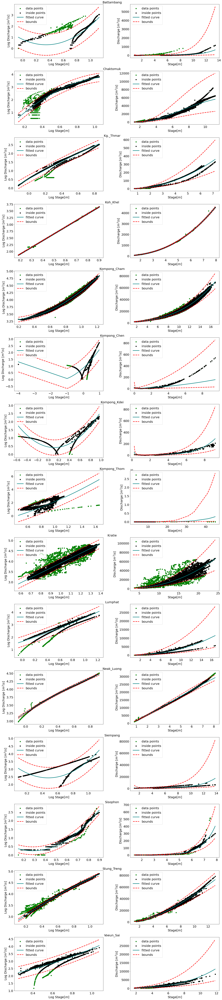

In [181]:
nrows = 15

fig, ax = plt.subplots(nrows=nrows, ncols=2, figsize=(20, nrows*6))

for index, _station in enumerate(stations):
    station = _station['name']

    df = pd.read_csv(f'{data_path}/station_data/{station}/stage_discharge.csv', index_col='datetime')
    df.loc[df.stage == 0, 'stage'] = 0.0001
    df.loc[df.discharge == 0, 'discharge'] = 0.0001
    df.index = pd.to_datetime(df.index)
    df = df.resample('1D').mean().dropna()
    df = df.sort_index()

    x_hat = np.linspace(np.log10(_station['min_stage']), np.log10(_station['max_stage']), num=1000)



    df['log_stage'] = np.log10(df.stage)
    df['log_discharge'] = np.log10(df.discharge)

    df = df.sort_values(by=['log_stage'])

    # statsmodel
    # taken from https://stackoverflow.com/questions/17559408/confidence-and-prediction-intervals-with-statsmodels/47191929#47191929
    # https://ostwalprasad.github.io/machine-learning/Polynomial-Regression-using-statsmodel.html
    X = sm.add_constant(df.log_stage)

    log_stage = np.array(df.log_stage).reshape(-1, 1)
    log_discharge = np.array(df.log_discharge).reshape(-1, 1)

    polynomial_features= PolynomialFeatures(degree=2)
    xp = polynomial_features.fit_transform(log_stage)

    regr = sm.OLS(df.log_discharge, xp)

    est = regr.fit()

    # predictions = est.get_prediction(xp)
    predictions = est.predict(xp)

    prstd, iv_l, iv_u = wls_prediction_std(est)

    st, data, ss2 = summary_table(est, alpha=0.05)

    fittedvalues = data[:,2]
    predict_mean_se  = data[:,3]
    # predict_mean_ci_low, predict_mean_ci_upp = data[:,4:6].T
    predict_ci_low, predict_ci_upp = data[:,6:8].T

    _df = df.loc[(df.log_discharge > predict_ci_low) & (df.log_discharge < predict_ci_upp)]

    ax[index][0].scatter(df.log_stage, df.log_discharge, c='g', label='data points')
    ax[index][0].scatter(_df.log_stage, _df.log_discharge, c='black', label='inside points')
    ax[index][0].plot(df.log_stage, fittedvalues, '-', c='teal', lw=3, label='fitted curve')
    ax[index][0].plot(df.log_stage, predict_ci_low, 'r--', lw=3, label='bounds')
    ax[index][0].plot(df.log_stage, predict_ci_upp, 'r--', lw=3)
    # ax[index][0].plot(df.log_stage, predict_mean_ci_low, 'b--', lw=3)
    # ax[index][0].plot(df.log_stage, predict_mean_ci_upp, 'b--', lw=3)

    ax[index][0].set_ylabel('Log Discharge [$m^{3}/s$]', fontsize=20)
    ax[index][0].set_xlabel('Log Stage[$m$]', fontsize=20)
    ax[index][0].tick_params(axis='both', which='major', labelsize=20)
    ax[index][0].legend(loc='upper left', prop={'size': 20})
    ax[index][0].set_title(station, fontsize=20, x=1.1)

    ax[index][1].scatter(10 ** df.log_stage, 10 ** df.log_discharge, c='g', label='data points')
    ax[index][1].scatter(10 ** _df.log_stage, 10 ** _df.log_discharge, c='black', label='inside points')
    ax[index][1].plot(10 ** df.log_stage, 10 ** fittedvalues, '-', c='teal', lw=3, label='fitted curve')
    ax[index][1].plot(10 ** df.log_stage, 10 ** predict_ci_low, 'r--', lw=3, label='bounds')
    ax[index][1].plot(10 ** df.log_stage, 10 ** predict_ci_upp, 'r--', lw=3)

    ax[index][1].set_ylabel('Discharge [$m^{3}/s$]', fontsize=20)
    ax[index][1].set_xlabel('Stage[$m$]', fontsize=20)
    ax[index][1].tick_params(axis='both', which='major', labelsize=20)
    ax[index][1].legend(loc='upper left', prop={'size': 20})

    _df = _df.drop(['log_stage', 'log_discharge'], axis=1)
    _df.to_csv(f'{data_path}/station_data_ci/{station}.csv', encoding='utf-8', index=True)

plt.tight_layout()
plt.show()

#### DDRC

##### parameters

In [215]:
# parameters

n_clusters = 2 # not a hyper parameter; do not change
cluster_time_only = False

# auto_p_50_threshold = 40 # 65
breakpoint_threshold = 40

# percent_margin = 15. # 16.
cluster_threshold = 15

train_size = 0.75
random_state = 5
nu = 0.05 # 0.18
kernel = 'rbf' # 'rbf'
gamma = 0.07 # 'scale'
tol = 1e-6 # 1e-6'

##### clustering and outlier detection

distance: 6.275477744310574
break_pt_diff_0: 42.21308857819463
break_pt_diff_1: 53.2110088124871


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


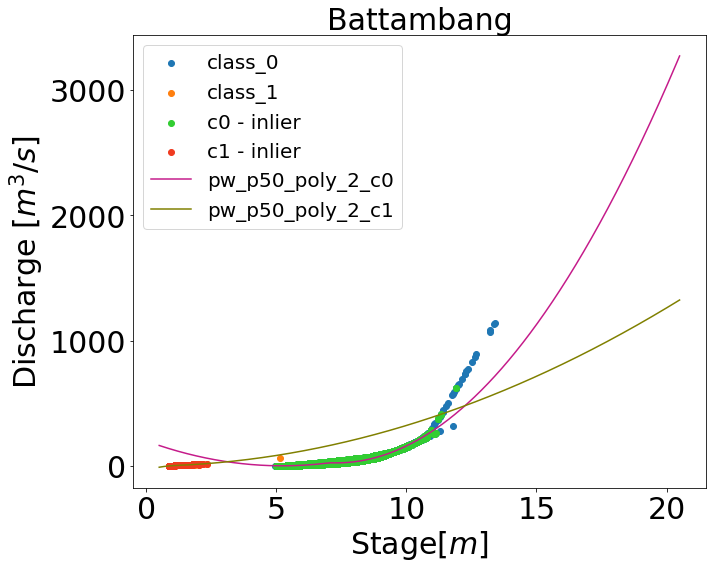

distance: 0.0034104333244737717
total len of df: 11445
total len of outlier df: 1445
total len of inlier df: 10000
total len of train df: 7500
total len of test df: 2500
break_pt_diff: 47.291044593892


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


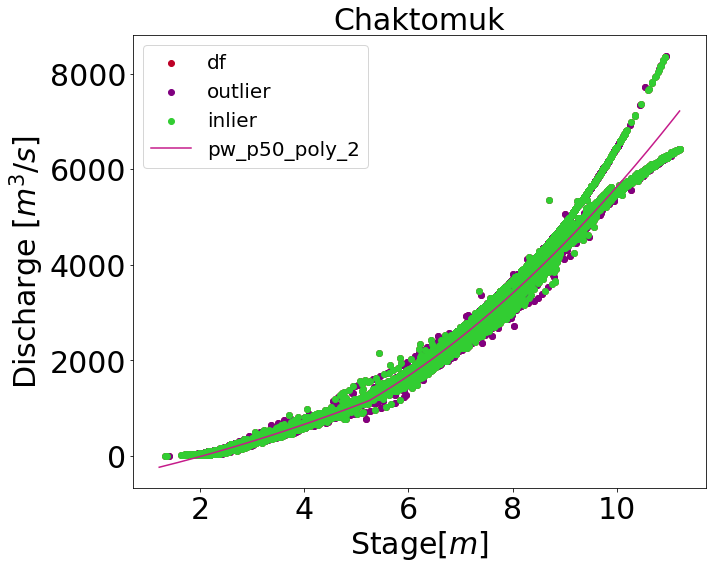

distance: 1.191966983484408
break_pt_diff_0: 167.73256036590217
break_pt_diff_1: 3.447583791866103


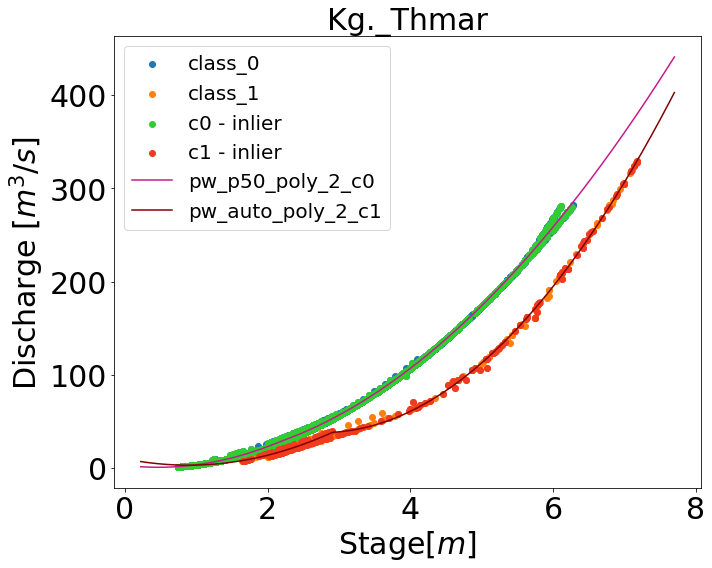

distance: 0.33976250468636593
total len of df: 3626
total len of outlier df: 1528
total len of inlier df: 2098
total len of train df: 1573
total len of test df: 525
break_pt_diff: 1.8131515405396013


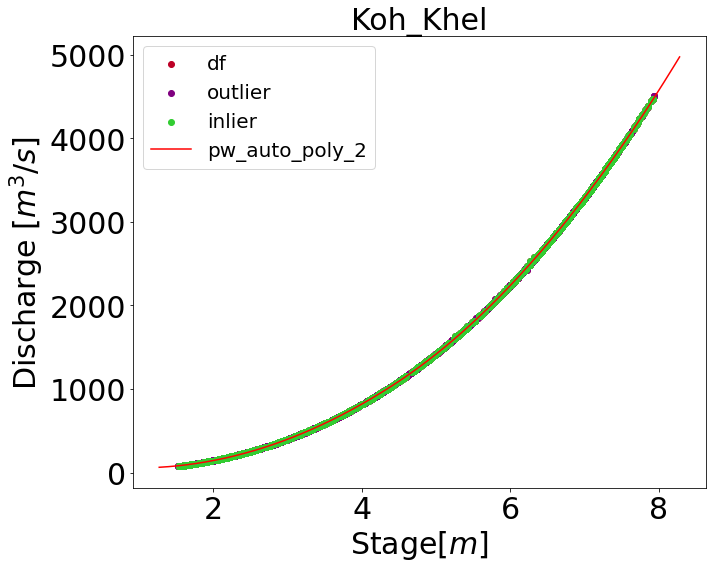

distance: 0.21560482977584527
total len of df: 15331
total len of outlier df: 4709
total len of inlier df: 10622
total len of train df: 7966
total len of test df: 2656
break_pt_diff: 59.02884694723407


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


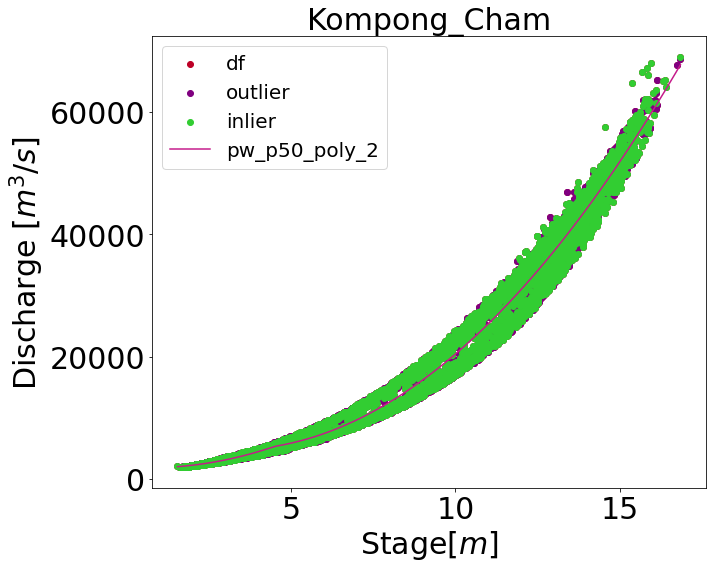

distance: 0.38180673528765974
total len of df: 1693
total len of outlier df: 157
total len of inlier df: 1536
total len of train df: 1152
total len of test df: 384
break_pt_diff: 35.95210933668909


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


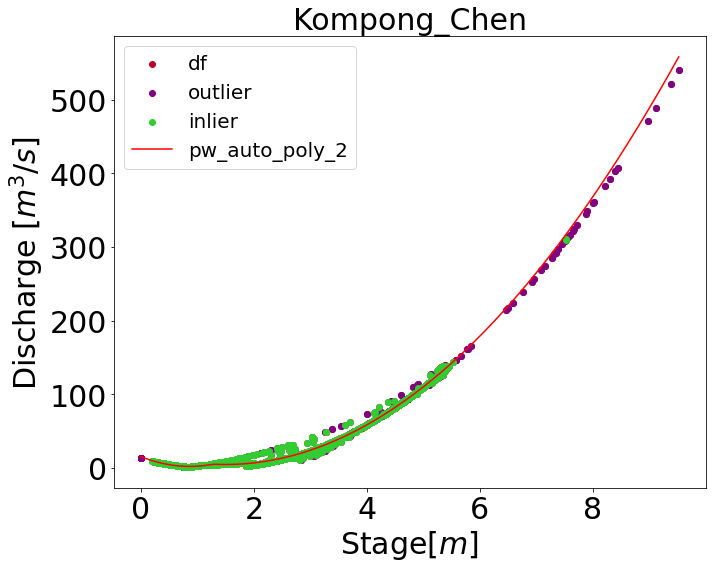

distance: 1.9318410654827978
break_pt_diff_0: 74.82517557153005
break_pt_diff_1: 76.55367207613543


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


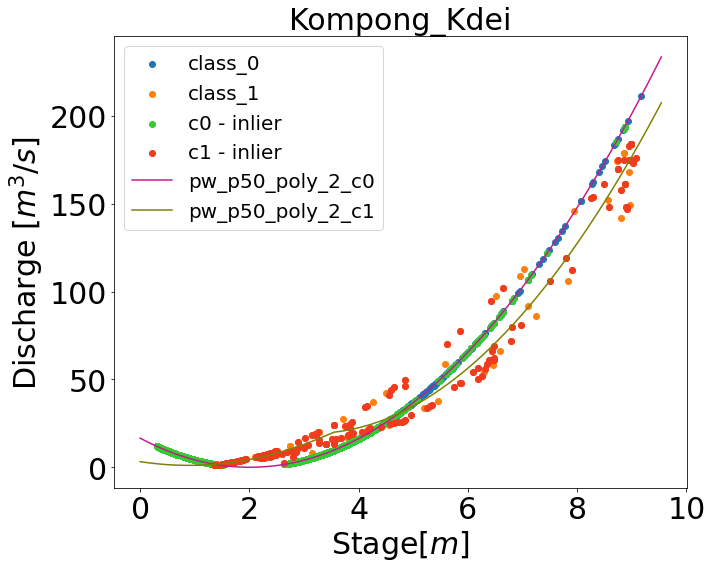

distance: 1.4967214505532693


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


break_pt_diff_0: 26.102169310221456
break_pt_diff_1: 30.22567467904463


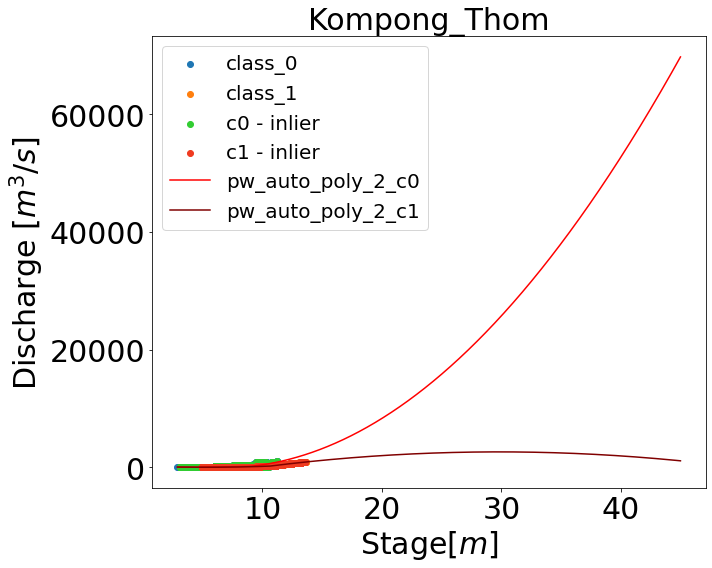

distance: 0.16726510190689936
total len of df: 17805
total len of outlier df: 3604
total len of inlier df: 14201
total len of train df: 10650
total len of test df: 3551


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


break_pt_diff: 17.227078251906256


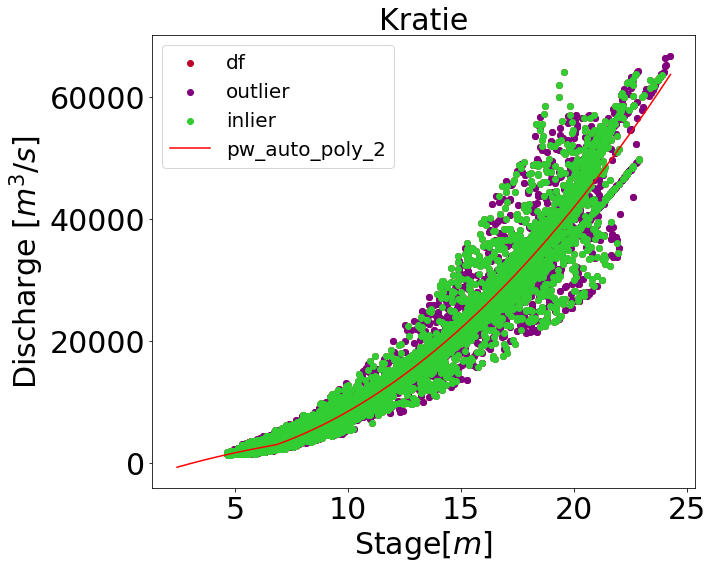

distance: 2.234430772523522
break_pt_diff_0: 415.72394364903334
break_pt_diff_1: 49.762311161398834


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


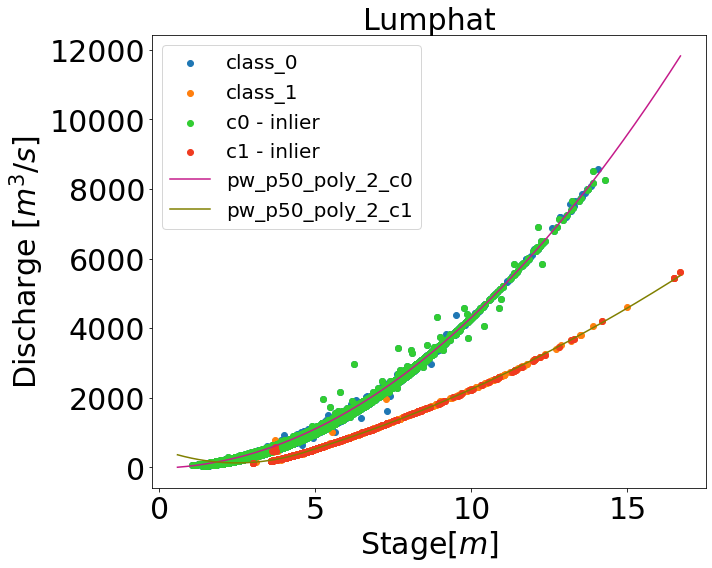

distance: 0.1858019929704402
total len of df: 8120
total len of outlier df: 3126
total len of inlier df: 4994
total len of train df: 3745
total len of test df: 1249
break_pt_diff: 57.29517863139429


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


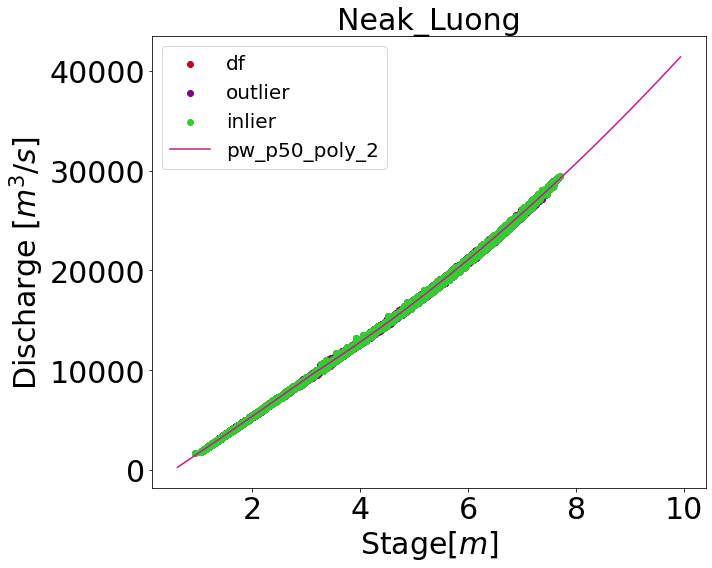

distance: 2.8490646632287535
break_pt_diff_0: 7.533553591247408
break_pt_diff_1: 104.73071105799411


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


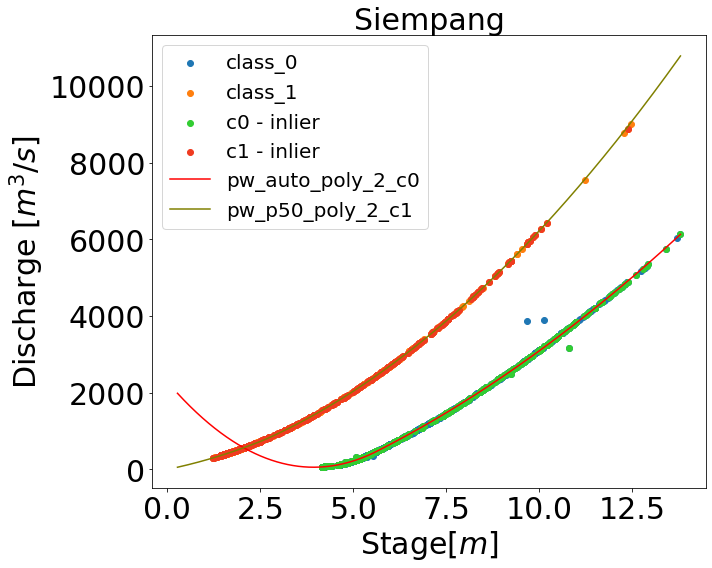

distance: 1.1678266799929449
break_pt_diff_0: 10.937273524879014
break_pt_diff_1: 149.51571709134706


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


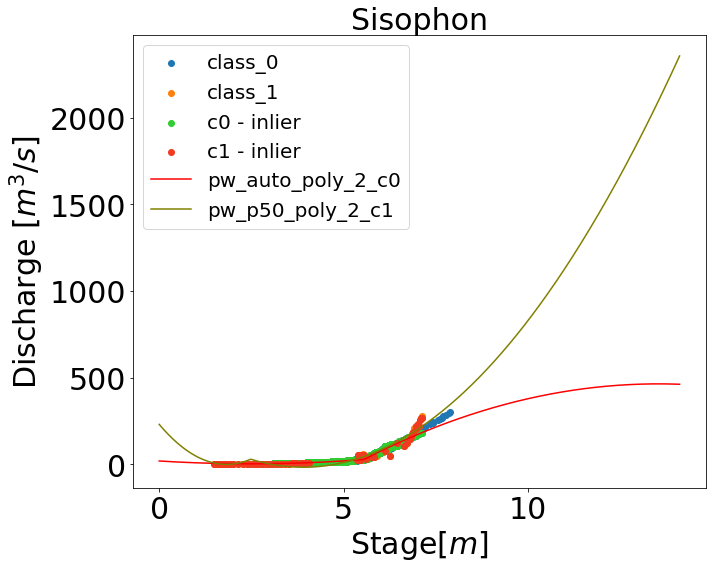

distance: 0.1474602038323809
total len of df: 36703
total len of outlier df: 14823
total len of inlier df: 21880
total len of train df: 16410
total len of test df: 5470


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


break_pt_diff: 51.562500486486165


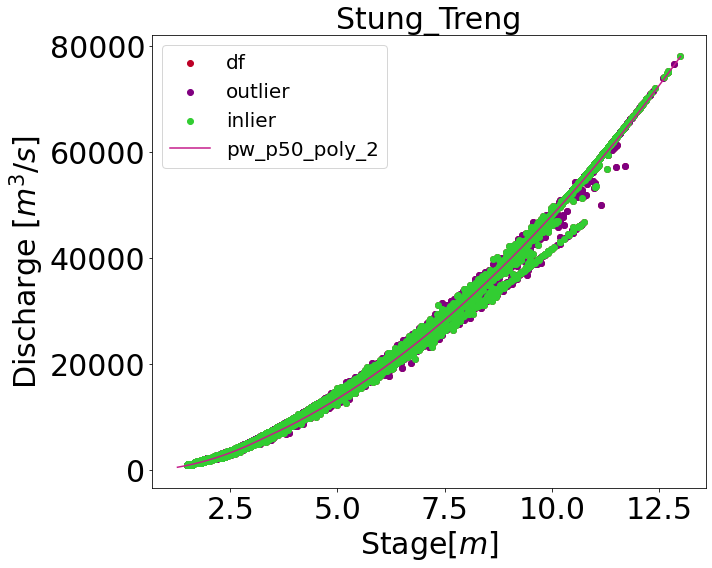

distance: 2.0376125329761545
break_pt_diff_0: 7.936609145334724
break_pt_diff_1: 31.465643244695517


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1108: RuntimeWarning: invalid value encountered in double_scalars
  self.slopes[i] = (y_hat[i+1]-y_hat[i]) / \


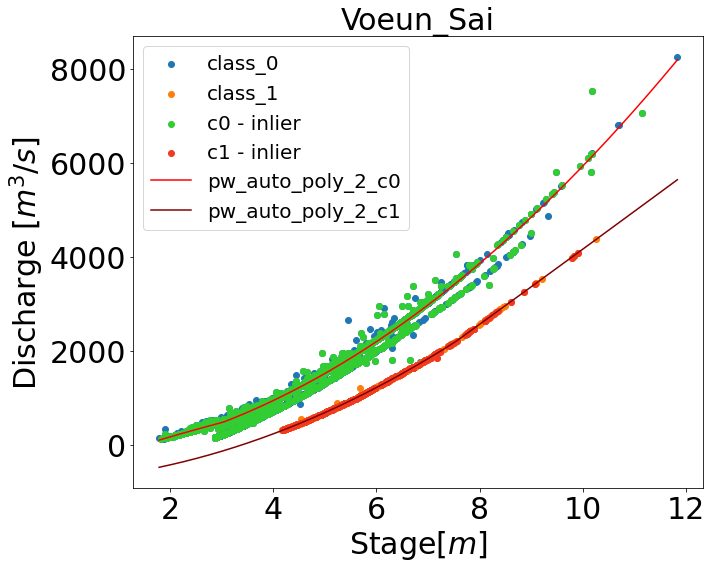

In [216]:
for _station in stations:
    station = _station['name']

    station_min_stage = _station['min_stage']
    station_max_stage = _station['max_stage']

    # df_discharge = pd.read_csv(f'{data_path}/{station}/discharge.csv', index_col='datetime')
    # df_stage = pd.read_csv(f'{data_path}/{station}/stage.csv', index_col='datetime')

    # _df = pd.merge(df_stage, df_discharge, left_index=True, right_index=True, how='inner')

    _df = pd.read_csv(f'{data_path}/station_data_ci/{station}.csv', index_col='datetime')
    _df.index = pd.to_datetime(_df.index)
    _df = _df.sort_index()
    _df = _df.resample('1D').mean().dropna()

    time_array = pd.to_datetime(_df.index).view(np.int64)
    _df['time'] = time_array

    # stage, time, discharge
    x = [[row.stage, row.time, row.discharge] for index, row in _df.iterrows()]
    X = np.array(x)

    Path(f'{data_path}/rating_curve/train_validate/{station}').mkdir(parents=True, exist_ok=True)

    # needs_cluster is run on whole dataset
    model, yhat, pd_c0, pd_c1 = cluster_utils.make_clusters(X, station_min_stage,
                                                            time_only=cluster_time_only,
                                                            n_clusters=n_clusters,
                                                            random_state=random_state)

    # needs_cluster = cluster_utils.needs_cluster(pd_c0, pd_c1, cluster_threshold)
    distance = cluster_utils.model_cluster_distance(model)
    print(f'distance: {distance}')
    if distance >= 1:
        needs_cluster = True
    else:
        needs_cluster = False

    # figure common initialize
    # fig = plot_utils.initialize_fig(title = f'{station}: Stage Vs Discharge',
    #                                 x_axis_label = 'Stage Height (m)',
    #                                 y_axis_label = 'Discharge (m3/s)',
    #                                 tooltips = [
    #                                     ('stage',     '$x'),
    #                                     ('discharge', '$y'),
    #                                     ('date',      '@datetime{%F}'),
    #                                 ],
    #                                 formatters = { '@datetime' : 'datetime' },
    #                                )

    Path(f'{data_path}/rating_curve/plot_data/{station}').mkdir(parents=True, exist_ok=True)

    if needs_cluster:
        # cluster 0
        q_c0_25 = np.quantile(pd_c0.stage, 0.25)
        q_c0_50 = np.quantile(pd_c0.stage, 0.5)
        q_c0_75 = np.quantile(pd_c0.stage, 0.75)
        conditions_c0 = [
            (pd_c0['stage'] <  q_c0_25),
            (pd_c0['stage'] >= q_c0_25) & (pd_c0['stage'] < q_c0_50),
            (pd_c0['stage'] >= q_c0_50) & (pd_c0['stage'] < q_c0_75),
            (pd_c0['stage'] >= q_c0_75),
        ]
        class_values_c0 = [1, 2, 3, 4]
        pd_c0['quantile_class'] = np.select(conditions_c0, class_values_c0, default=1)

        # cluster 1
        q_c1_25 = np.quantile(pd_c1.stage, 0.25)
        q_c1_50 = np.quantile(pd_c1.stage, 0.5)
        q_c1_75 = np.quantile(pd_c1.stage, 0.75)
        conditions_c1 = [
            (pd_c1['stage'] <  q_c1_25),
            (pd_c1['stage'] >= q_c1_25) & (pd_c1['stage'] < q_c1_50),
            (pd_c1['stage'] >= q_c1_50) & (pd_c1['stage'] < q_c1_75),
            (pd_c1['stage'] >= q_c1_75),
        ]
        class_values_c1 = [1, 2, 3, 4]
        pd_c1['quantile_class'] = np.select(conditions_c1, class_values_c1, default=1)


        # cluster 0
        clf_c0 = svm.OneClassSVM(nu=nu, kernel=kernel, gamma=gamma, tol=tol)
        pred_c0 = clf_c0.fit_predict(pd_c0[['stage', 'discharge']].values.tolist())
        outlier_c0_df = pd_c0[pred_c0 == -1]
        inlier_c0_df = pd_c0[pred_c0 == 1]

        c0_train_df, c0_test_df = train_test_split(inlier_c0_df, train_size=train_size, shuffle=True, stratify=inlier_c0_df.quantile_class, random_state=random_state)
        # save the test for later reuse
        if 'quantile' in c0_train_df:
            c0_train_df, c0_test_df = c0_train_df.drop(['quantile', 'quantile_class'], axis=1).sort_index(), c0_test_df.drop(['quantile', 'quantile_class'], axis=1).sort_index()
        c0_test_df.to_csv(f'{data_path}/rating_curve/train_validate/{station}/X_c0_test_cluster_quantile.csv', encoding='utf-8', index=True)

        # cluster 1
        clf_c1 = svm.OneClassSVM(nu=nu, kernel=kernel, gamma=gamma, tol=tol)
        pred_c1 = clf_c1.fit_predict(pd_c1[['stage', 'discharge']].values.tolist())
        outlier_c1_df = pd_c1[pred_c1 == -1]
        inlier_c1_df = pd_c1[pred_c1 == 1]

        c1_train_df, c1_test_df = train_test_split(inlier_c1_df, train_size=train_size, shuffle=True, stratify=inlier_c1_df.quantile_class, random_state=random_state)
        # save the test for later reuse
        if 'quantile' in c1_train_df:
            c1_train_df, c1_test_df = c1_train_df.drop(['quantile', 'quantile_class'], axis=1).sort_index(), c1_test_df.drop(['quantile', 'quantile_class'], axis=1).sort_index()
        c1_test_df.to_csv(f'{data_path}/rating_curve/train_validate/{station}/X_c1_test_cluster_quantile.csv', encoding='utf-8', index=True)

        p0_50 = np.percentile(np.asarray(inlier_c0_df.stage), 50)
        p1_50 = np.percentile(np.asarray(inlier_c1_df.stage), 50)

        x_hat = np.linspace(station_min_stage, station_max_stage, num=10000)
        x_log_hat = np.linspace(np.log10(station_min_stage), np.log10(station_max_stage), num=10000)

        breaks_0 = np.array([station_min_stage, p0_50, station_max_stage])
        breaks_1 = np.array([station_min_stage, p1_50, station_max_stage])

        # pw auto fit
        # cluster 0
        pwlf_0 = pwlf.PiecewiseLinFit(inlier_c0_df.stage, inlier_c0_df.discharge, degree=2)
        break_0 = pwlf_0.fit(2)
        pw_auto_poly_2_c0 = pwlf_0.predict(x_hat, breaks=break_0)
        # print(pwlf_0.standard_errors())

        # cluster 1
        pwlf_1 = pwlf.PiecewiseLinFit(inlier_c1_df.stage, inlier_c1_df.discharge, degree=2)
        break_1 = pwlf_1.fit(2)
        pw_auto_poly_2_c1 = pwlf_1.predict(x_hat, breaks=break_1)

        # pw p50 fit
        # cluster 0
        pwlf_p_0 = pwlf.PiecewiseLinFit(inlier_c0_df.stage, inlier_c0_df.discharge, degree=2)
        ssr_0 = pwlf_p_0.fit_with_breaks(breaks_0)
        pw_p50_poly_2_c0 = pwlf_p_0.predict(x_hat, breaks=breaks_0)

        # cluster 1
        pwlf_p_1 = pwlf.PiecewiseLinFit(inlier_c1_df.stage, inlier_c1_df.discharge, degree=2)
        ssr_1 = pwlf_p_1.fit_with_breaks(breaks_1)
        pw_p50_poly_2_c1 = pwlf_p_1.predict(x_hat, breaks=breaks_1)

        # cluster 0
        break_pt_diff_0 = (abs(p0_50 - break_0[1]) / p0_50) * 100
        in_out_0 = 'auto' if break_pt_diff_0 < breakpoint_threshold else 'p_50'
        print(f'break_pt_diff_0: {break_pt_diff_0}')

        # cluster 1
        break_pt_diff_1 = (abs(p1_50 - break_1[1]) / p1_50) * 100
        in_out_1 = 'auto' if break_pt_diff_1 <= breakpoint_threshold else 'p_50'
        print(f'break_pt_diff_1: {break_pt_diff_1}')

        with open(f'{data_path}/rating_curve/train_validate/{station}/model_cluster_quantile.pkl', 'wb') as m: pickle.dump(model, m)
        with open(f'{data_path}/rating_curve/train_validate/{station}/c0_m_cluster_quantile.pkl', 'wb') as c0_m:  pickle.dump(pwlf_0 if in_out_0 == 'auto' else pwlf_p_0, c0_m)
        with open(f'{data_path}/rating_curve/train_validate/{station}/c1_m_cluster_quantile.pkl', 'wb') as c1_m:  pickle.dump(pwlf_1 if in_out_1 == 'auto' else pwlf_p_1, c1_m)

        # get row indexes for samples with this cluster
        class_map = {}
        for _class in range(n_clusters):
            class_map[_class] = np.where(yhat == _class)

        fig1, ax = plt.subplots(figsize=(10, 8))

        colors = ['#1f77b4', '#ff7f0e']
        for _class in range(n_clusters):
            _stage = X[class_map[_class], 0][0]
            _discharge = X[class_map[_class], 2][0]
            ax.scatter(_stage, _discharge, c=colors[_class], label=f'class_{_class}')

        # ax.scatter(outlier_c0_df.stage, outlier_c0_df.discharge, c='purple', label=f'c0 - outlier')
        ax.scatter(inlier_c0_df.stage, inlier_c0_df.discharge, c='limegreen', label=f'c0 - inlier')

        # ax.scatter(outlier_c1_df.stage, outlier_c1_df.discharge, c='#54278f', label=f'c1 - outlier')
        ax.scatter(inlier_c1_df.stage, inlier_c1_df.discharge, c='#f03b20', label=f'c1 - inlier')

        if in_out_0 == 'auto':
            ax.plot(x_hat, pw_auto_poly_2_c0, c='red', label='pw_auto_poly_2_c0')
        else:
            ax.plot(x_hat, pw_p50_poly_2_c0, c='#c51b8a', label='pw_p50_poly_2_c0')

        if in_out_1 == 'auto':
            ax.plot(x_hat, pw_auto_poly_2_c1, c='maroon', label='pw_auto_poly_2_c1')
        else:
            ax.plot(x_hat, pw_p50_poly_2_c1, c='olive', label='pw_p50_poly_2_c1')

        ax.set_title(station, fontsize=30)
        ax.set_ylabel('Discharge [$m^{3}/s$]', fontsize=30)
        ax.set_xlabel('Stage[$m$]', fontsize=30)
        ax.tick_params(axis='both', which='major', labelsize=30)
        ax.legend(loc='upper left', prop={'size': 20})

        plt.tight_layout()
        plt.show()

        # all classes
        for _class in range(n_clusters):
            _stage = X[class_map[_class], 0][0]
            _discharge = X[class_map[_class], 2][0]
            datetime_int = X[class_map[_class], 1][0]
            _datetime = [pd.to_datetime(_datetime_int) for _datetime_int in datetime_int]
            _source = pd.DataFrame(dict(stage=_stage, discharge=_discharge, datetime=_datetime))
            _source.to_csv(f'{data_path}/rating_curve/plot_data/{station}/c{_class}.csv', encoding='utf-8', index=True)

        # train-test
        c0_train_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/c0_train.csv', encoding='utf-8', index=True)
        c0_test_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/c0_test.csv', encoding='utf-8', index=True)

        c1_train_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/c1_train.csv', encoding='utf-8', index=True)
        c1_test_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/c1_test.csv', encoding='utf-8', index=True)


        # inlier outlier for each class
        inlier_c0_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/inlier_c0.csv', encoding='utf-8', index=True)
        outlier_c0_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/outlier_c0.csv', encoding='utf-8', index=True)
        inlier_c1_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/inlier_c1.csv', encoding='utf-8', index=True)
        outlier_c1_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/outlier_c1.csv', encoding='utf-8', index=True)

        # inlier prediction
        pw_auto_poly_2_c0_df = pd.DataFrame({'stage': x_hat, 'discharge': pw_auto_poly_2_c0})
        pw_p50_poly_2_c0_df = pd.DataFrame({'stage': x_hat, 'discharge': pw_p50_poly_2_c0})
        pw_auto_poly_2_c1_df = pd.DataFrame({'stage': x_hat, 'discharge': pw_auto_poly_2_c1})
        pw_p50_poly_2_c1_df = pd.DataFrame({'stage': x_hat, 'discharge': pw_p50_poly_2_c1})

        # piecewise prediction rating curve
        pw_auto_poly_2_c0_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/pw_auto_c0.csv', encoding='utf-8', index=True)
        pw_p50_poly_2_c0_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/pw_p50_c0.csv', encoding='utf-8', index=True)
        pw_auto_poly_2_c1_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/pw_auto_c1.csv', encoding='utf-8', index=True)
        pw_p50_poly_2_c1_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/pw_p50_c1.csv', encoding='utf-8', index=True)

        # Get the slopes
        my_slopes = pwlf_0.slopes
        # Get my model parameters
        beta = pwlf_0.beta
        # calculate the standard errors associated with each beta parameter
        se = pwlf_0.standard_errors()
        # calculate the sum of the square of the residuals
        ssr = pwlf_0.fit_with_breaks(pwlf_0.fit_breaks)
        # calculate the unbiased standard deviation
        sigma_0 = np.sqrt(ssr / (pwlf_0.n_data - pwlf_0.n_parameters))

        # Get the slopes
        my_slopes = pwlf_1.slopes
        # Get my model parameters
        beta = pwlf_1.beta
        # calculate the standard errors associated with each beta parameter
        se = pwlf_1.standard_errors()
        # calculate the sum of the square of the residuals
        ssr = pwlf_1.fit_with_breaks(pwlf_1.fit_breaks)
        # calculate the unbiased standard deviation
        sigma_1 = np.sqrt(ssr / (pwlf_1.n_data - pwlf_1.n_parameters))

        # Get the slopes
        my_slopes = pwlf_p_0.slopes
        # Get my model parameters
        beta = pwlf_p_0.beta
        # calculate the standard errors associated with each beta parameter
        se = pwlf_p_0.standard_errors()
        # calculate the sum of the square of the residuals
        ssr = pwlf_p_0.fit_with_breaks(pwlf_p_0.fit_breaks)
        # calculate the unbiased standard deviation
        sigma_p_0 = np.sqrt(ssr / (pwlf_p_0.n_data - pwlf_p_0.n_parameters))

        # Get the slopes
        my_slopes = pwlf_p_1.slopes
        # Get my model parameters
        beta = pwlf_p_1.beta
        # calculate the standard errors associated with each beta parameter
        se = pwlf_p_1.standard_errors()
        # calculate the sum of the square of the residuals
        ssr = pwlf_p_1.fit_with_breaks(pwlf_p_1.fit_breaks)
        # calculate the unbiased standard deviation
        sigma_p_1 = np.sqrt(ssr / (pwlf_p_1.n_data - pwlf_p_1.n_parameters))

        with open(f'{data_path}/rating_curve/plot_data/{station}/data.json', 'w', encoding='utf-8') as f:
            data = {
                'in_out_0'  : in_out_0,
                'in_out_1'  : in_out_1,
                'sigma_0'   : sigma_0,
                'sigma_1'   : sigma_1,
                'sigma_p_0' : sigma_p_0,
                'sigma_p_1' : sigma_p_1,
            }
            json.dump(data, f, ensure_ascii=False, indent=4)

    else:
        q_25 = np.quantile(_df.stage, 0.25)
        q_50 = np.quantile(_df.stage, 0.5)
        q_75 = np.quantile(_df.stage, 0.75)
        conditions = [
            (_df['stage'] <  q_25),
            (_df['stage'] >= q_25) & (_df['stage'] < q_50),
            (_df['stage'] >= q_50) & (_df['stage'] < q_75),
            (_df['stage'] >= q_75),
        ]
        class_values = [1, 2, 3, 4]
        _df['quantile_class'] = np.select(conditions, class_values, default=1)

        clf = svm.OneClassSVM(nu=nu, kernel=kernel, gamma=gamma, tol=tol)
        pred = clf.fit_predict(_df[['stage', 'discharge']].values.tolist())

        print(f'total len of df: {len(_df)}')

        outlier_df = _df[pred == -1]
        outlier_df = outlier_df.sort_index()
        inlier_df = _df[pred == 1]
        inlier_df = inlier_df.sort_index()

        print(f'total len of outlier df: {len(outlier_df)}')
        print(f'total len of inlier df: {len(inlier_df)}')

        train_df, test_df = train_test_split(inlier_df, train_size=train_size, shuffle=True, random_state=random_state, stratify=inlier_df.quantile_class)

        train_df = train_df.drop(['time', 'quantile_class'], axis=1).sort_index()
        test_df = test_df.drop(['time', 'quantile_class'], axis=1).sort_index()

        print(f'total len of train df: {len(train_df)}')
        print(f'total len of test df: {len(test_df)}')

        # save the test for later reuse
        test_df.to_csv(f'{data_path}/rating_curve/train_validate/{station}/X_test_cluster_quantile.csv', encoding='utf-8', index=True)


        p_50 = np.percentile(np.asarray(inlier_df.stage), 50)

        x_hat = np.linspace(station_min_stage, station_max_stage, num=10000)
        x_log_hat = np.linspace(np.log10(station_min_stage), np.log10(station_max_stage), num=10000)

        breaks = np.array([station_min_stage, p_50, station_max_stage])

        # pw auto fit
        pwlf_a = pwlf.PiecewiseLinFit(inlier_df.stage, inlier_df.discharge, degree=2)
        break_0 = pwlf_a.fit(2)
        pw_auto_poly_2 = pwlf_a.predict(x_hat, breaks=break_0)

        # pw p50 fit
        pwlf_p = pwlf.PiecewiseLinFit(inlier_df.stage, inlier_df.discharge, degree=2)
        ssr_0 = pwlf_p.fit_with_breaks(breaks)
        pw_p50_poly_2 = pwlf_p.predict(x_hat, breaks=breaks)

        break_pt_diff = (abs(p_50 - break_0[1]) / p_50) * 100
        print(f'break_pt_diff: {break_pt_diff}')
        in_out = 'auto' if break_pt_diff < breakpoint_threshold else 'p_50'

        with open(f'{data_path}/rating_curve/train_validate/{station}/c_m_cluster_quantile.pkl', 'wb') as c_m:  pickle.dump(pwlf_a if in_out == 'auto' else pwlf_p, c_m)

        fig1, ax = plt.subplots(figsize=(10, 8))

        ax.scatter(_df.stage, _df.discharge, c='#bd0026', label=f'df')

        ax.scatter(outlier_df.stage, outlier_df.discharge, c='purple', label=f'outlier')
        ax.scatter(inlier_df.stage, inlier_df.discharge, c='limegreen', label=f'inlier')

        if in_out == 'auto':
            ax.plot(x_hat, pw_auto_poly_2, c='red', label='pw_auto_poly_2')
        else:
            ax.plot(x_hat, pw_p50_poly_2, c='#c51b8a', label='pw_p50_poly_2')

        # ax.plot(x_hat, pw_auto_poly_2, c='red', label='pw_auto_poly_2')
        # ax.plot(x_hat, pw_p50_poly_2, c='#c51b8a', label='pw_p50_poly_2')
        ax.set_title(station, fontsize=30)
        ax.set_ylabel('Discharge [$m^{3}/s$]', fontsize=30)
        ax.set_xlabel('Stage[$m$]', fontsize=30)
        ax.tick_params(axis='both', which='major', labelsize=30)
        ax.legend(loc='upper left', prop={'size': 20})

        plt.tight_layout()
        plt.show()

        # all data
        _df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/all.csv', encoding='utf-8', index=True)

#         train-test
        train_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/train.csv', encoding='utf-8', index=True)
        test_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/test.csv', encoding='utf-8', index=True)

#         inlier outlier for each class
        inlier_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/inlier.csv', encoding='utf-8', index=True)
        outlier_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/outlier.csv', encoding='utf-8', index=True)

#         inlier prediction
        pw_auto_poly_2_df = pd.DataFrame({'stage': x_hat, 'discharge': pw_auto_poly_2})
        pw_p50_poly_2_df = pd.DataFrame({'stage': x_hat, 'discharge': pw_p50_poly_2})

#         piecewise prediction rating curve
        pw_auto_poly_2_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/pw_auto.csv', encoding='utf-8', index=True)
        pw_p50_poly_2_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/pw_p50.csv', encoding='utf-8', index=True)

        # Get the slopes
        my_slopes = pwlf_a.slopes
        # Get my model parameters
        beta = pwlf_a.beta
        # calculate the standard errors associated with each beta parameter
        se = pwlf_a.standard_errors()
        # calculate the sum of the square of the residuals
        ssr = pwlf_a.fit_with_breaks(pwlf_a.fit_breaks)
        # calculate the unbiased standard deviation
        sigma_a = np.sqrt(ssr / (pwlf_a.n_data - pwlf_a.n_parameters))

        # Get the slopes
        my_slopes = pwlf_p.slopes
        # Get my model parameters
        beta = pwlf_p.beta
        # calculate the standard errors associated with each beta parameter
        se = pwlf_p.standard_errors()
        # calculate the sum of the square of the residuals
        ssr = pwlf_p.fit_with_breaks(pwlf_p.fit_breaks)
        # calculate the unbiased standard deviation
        sigma_p = np.sqrt(ssr / (pwlf_p.n_data - pwlf_p.n_parameters))

        with open(f'{data_path}/rating_curve/plot_data/{station}/data.json', 'w', encoding='utf-8') as f:
            data = {
                'in_out' : in_out_0,
                'sigma_a': sigma_a,
                'sigma_p': sigma_p,
            }
            json.dump(data, f, ensure_ascii=False, indent=4)
    
    # fig1.savefig(f'{output_folder}/training_{left_out_station}.png', dpi=700)


##### Chaktomuk has negative values in it

This station does not need cluster so cutting right to chase and adjusting the pwlf to make it pass through the minimum stage and discharge values

In [221]:
selected = [_station for _station in stations if _station['name'] == 'Chaktomuk'][0]
selected

{'name': 'Chaktomuk',
 'min_stage': 1.22,
 'max_stage': 11.2,
 'min_discharge': 3.4,
 'max_discharge': 8370.0}

total len of df: 11445
total len of outlier df: 1445
total len of inlier df: 10000
total len of train df: 7500
total len of test df: 2500
break_pt_diff 50.567093577083
in_out: p_50


/Users/bbhandar/miniforge3/envs/cbias/lib/python3.9/site-packages/pwlf/pwlf.py:1556: LinAlgWarning: Ill-conditioned matrix (rcond=1.09995e-55): result may not be accurate.
  beta_prime = linalg.solve(K, z)


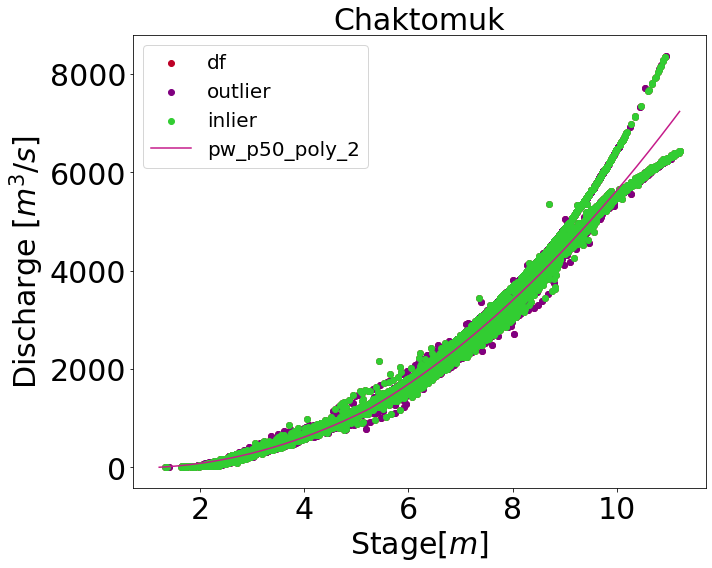

In [222]:
station = 'Chaktomuk'
selected = [_station for _station in stations if _station['name'] == station][0]

station_min_stage = selected['min_stage']
station_max_stage = selected['max_stage']

_df = pd.read_csv(f'{data_path}/station_data_ci/{station}.csv', index_col='datetime')
_df.index = pd.to_datetime(_df.index)
_df = _df.sort_index()
_df = _df.resample('1D').mean().dropna()

time_array = pd.to_datetime(_df.index).view(np.int64)
_df['time'] = time_array

q_25 = np.quantile(_df.stage, 0.25)
q_50 = np.quantile(_df.stage, 0.5)
q_75 = np.quantile(_df.stage, 0.75)
conditions = [
    (_df['stage'] <  q_25),
    (_df['stage'] >= q_25) & (_df['stage'] < q_50),
    (_df['stage'] >= q_50) & (_df['stage'] < q_75),
    (_df['stage'] >= q_75),
]
class_values = [1, 2, 3, 4]
_df['quantile_class'] = np.select(conditions, class_values, default=1)

clf = svm.OneClassSVM(nu=nu, kernel=kernel, gamma=gamma, tol=tol)
pred = clf.fit_predict(_df[['stage', 'discharge']].values.tolist())

print(f'total len of df: {len(_df)}')

outlier_df = _df[pred == -1]
outlier_df = outlier_df.sort_index()
inlier_df = _df[pred == 1]
inlier_df = inlier_df.sort_index()

print(f'total len of outlier df: {len(outlier_df)}')
print(f'total len of inlier df: {len(inlier_df)}')

train_df, test_df = train_test_split(inlier_df, train_size=train_size, shuffle=True, random_state=random_state, stratify=inlier_df.quantile_class)

train_df = train_df.drop(['time', 'quantile_class'], axis=1).sort_index()
test_df = test_df.drop(['time', 'quantile_class'], axis=1).sort_index()

print(f'total len of train df: {len(train_df)}')
print(f'total len of test df: {len(test_df)}')

# save the test for later reuse
test_df.to_csv(f'{data_path}/rating_curve/train_validate/{station}/X_test_cluster_quantile.csv', encoding='utf-8', index=True)


p_50 = np.percentile(np.asarray(inlier_df.stage), 50)

x_hat = np.linspace(station_min_stage, station_max_stage, num=10000)
x_log_hat = np.linspace(np.log10(station_min_stage), np.log10(station_max_stage), num=10000)

breaks = np.array([station_min_stage, p_50, station_max_stage])

# pw auto fit
pwlf_a = pwlf.PiecewiseLinFit(inlier_df.stage, inlier_df.discharge, degree=2)
# break_0 = pwlf_a.fit(2)
break_0 = pwlf_a.fit(2, [station_min_stage], [selected['min_discharge']])
pw_auto_poly_2 = pwlf_a.predict(x_hat, breaks=break_0)

# pw p50 fit
pwlf_p = pwlf.PiecewiseLinFit(inlier_df.stage, inlier_df.discharge, degree=2)
# ssr_0 = pwlf_p.fit_with_breaks(breaks)
ssr_0 = pwlf_p.fit_with_breaks_force_points(breaks, [station_min_stage], [selected['min_discharge']])
pw_p50_poly_2 = pwlf_p.predict(x_hat, breaks=breaks)

break_pt_diff = (abs(p_50 - break_0[1]) / p_50) * 100
print('break_pt_diff', break_pt_diff)
in_out = 'auto' if break_pt_diff < breakpoint_threshold else 'p_50'
print(f'in_out: {in_out}')

with open(f'{data_path}/rating_curve/train_validate/{station}/c_m_cluster_quantile.pkl', 'wb') as c_m:  pickle.dump(pwlf_a if in_out == 'auto' else pwlf_p, c_m)

fig1, ax = plt.subplots(figsize=(10, 8))

ax.scatter(_df.stage, _df.discharge, c='#bd0026', label=f'df')

ax.scatter(outlier_df.stage, outlier_df.discharge, c='purple', label=f'outlier')
ax.scatter(inlier_df.stage, inlier_df.discharge, c='limegreen', label=f'inlier')

if in_out == 'auto':
    ax.plot(x_hat, pw_auto_poly_2, c='red', label='pw_auto_poly_2')
else:
    ax.plot(x_hat, pw_p50_poly_2, c='#c51b8a', label='pw_p50_poly_2')

# ax.plot(np.arange(0, 4), np.array([1.22 for i in range(4)]))
# ax.set_xlim([0, 3])

# ax.plot(x_hat, pw_auto_poly_2, c='red', label='pw_auto_poly_2')
# ax.plot(x_hat, pw_p50_poly_2, c='#c51b8a', label='pw_p50_poly_2')
ax.set_title(station, fontsize=30)
ax.set_ylabel('Discharge [$m^{3}/s$]', fontsize=30)
ax.set_xlabel('Stage[$m$]', fontsize=30)
ax.tick_params(axis='both', which='major', labelsize=30)
ax.legend(loc='upper left', prop={'size': 20})

plt.tight_layout()
plt.show()

# all data
_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/all.csv', encoding='utf-8', index=True)

# train-test
train_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/train.csv', encoding='utf-8', index=True)
test_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/test.csv', encoding='utf-8', index=True)

# inlier outlier for each class
inlier_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/inlier.csv', encoding='utf-8', index=True)
outlier_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/outlier.csv', encoding='utf-8', index=True)

# inlier prediction
pw_auto_poly_2_df = pd.DataFrame({'stage': x_hat, 'discharge': pw_auto_poly_2})
pw_p50_poly_2_df = pd.DataFrame({'stage': x_hat, 'discharge': pw_p50_poly_2})

# piecewise prediction rating curve
pw_auto_poly_2_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/pw_auto.csv', encoding='utf-8', index=True)
pw_p50_poly_2_df.to_csv(f'{data_path}/rating_curve/plot_data/{station}/pw_p50.csv', encoding='utf-8', index=True)

with open(f'{data_path}/rating_curve/plot_data/{station}/data.json', 'w', encoding='utf-8') as f:
    data = {
        'in_out' : in_out_0,
        'sigma_a': sigma_a,
        'sigma_p': sigma_p,
    }
    json.dump(data, f, ensure_ascii=False, indent=4)


##### Apply Validation Dataset

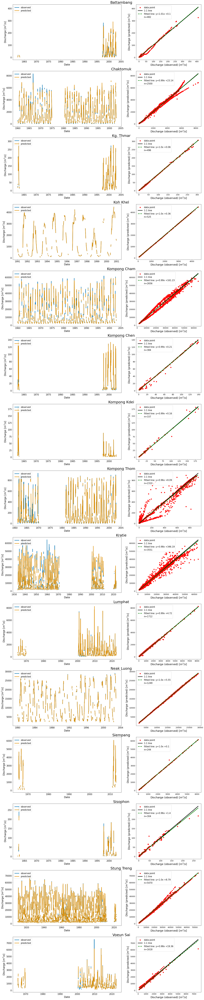

In [223]:
figs_scatter = []
figs_timeseries = []
scatter_plot = True

n_rows = len(stations)

fig = plt.figure(figsize=(20, 6.5*n_rows))
gs = gridspec.GridSpec(n_rows, 2, width_ratios=[5, 3])

for index, _station in enumerate(stations[:]):
    station = _station['name']
    
    station_min_stage = _station['min_stage']
    station_min_stage = station_min_stage if station_min_stage else 0.0001

    needs_cluster = True
    if not Path(f'{data_path}/rating_curve/train_validate/{station}/model_cluster_quantile.pkl').exists():
        needs_cluster = False

    if needs_cluster:

        c0_df = pd.read_csv(f'{data_path}/rating_curve/train_validate/{station}/X_c0_test_cluster_quantile.csv', index_col='datetime')
        c0_df.index = pd.to_datetime(c0_df.index)
        c0_df['time'] = pd.to_datetime(c0_df.index).view(np.int64)

        c1_df = pd.read_csv(f'{data_path}/rating_curve/train_validate/{station}/X_c1_test_cluster_quantile.csv', index_col='datetime')
        c1_df.index = pd.to_datetime(c1_df.index)
        c1_df['time'] = pd.to_datetime(c1_df.index).view(np.int64)

        with open(f'{data_path}/rating_curve/train_validate/{station}/c0_m_cluster_quantile.pkl', 'rb') as m_0: c0_m = pickle.load(m_0)
        with open(f'{data_path}/rating_curve/train_validate/{station}/c1_m_cluster_quantile.pkl', 'rb') as m_1: c1_m = pickle.load(m_1)

        X_sel_c_0 = np.array([[row.stage, row.time] for index, row in c0_df.iterrows()])
        X_sel_c_0[:, 0] = np.clip(X_sel_c_0[:, 0], station_min_stage, None)

        X_sel_c_1 = np.array([[row.stage, row.time] for index, row in c1_df.iterrows()])
        X_sel_c_1[:, 0] = np.clip(X_sel_c_1[:, 0], station_min_stage, None)

        m_0 = c0_m.predict(X_sel_c_0[:, 0])
        c0_df['predicted'] = m_0

        m_1 = c1_m.predict(X_sel_c_1[:, 0])
        c1_df['predicted'] = m_1

        df = pd.concat([c0_df, c1_df])

    else:

        df = pd.read_csv(f'{data_path}/rating_curve/train_validate/{station}/X_test_cluster_quantile.csv', index_col='datetime')
        df.index = pd.to_datetime(df.index)
        df['time'] = pd.to_datetime(df.index).view(np.int64)

        with open(f'{data_path}/rating_curve/train_validate/{station}/c_m_cluster_quantile.pkl', 'rb') as m_: c_m = pickle.load(m_)

        X = np.array([[row.stage, row.time] for index, row in df.iterrows()])
        X[:, 0] = np.clip(X[:, 0], station_min_stage, None)

        m_predict = c_m.predict(X[:, 0])
        df['predicted'] = m_predict

    df['predicted'] = df.predicted.clip(0, None)
    df = df.sort_index()
    df = df.drop(['time'], axis=1)

    Path(f'{data_path}/rating_curve/discharge_predicted_validation_points').mkdir(parents=True, exist_ok=True)
    df.to_csv(f'{data_path}/rating_curve/discharge_predicted_validation_points/{station}.csv', encoding='utf-8', index=True)

    # Do this before resampling by 1 week
    coefficients, others = np.polynomial.polynomial.polyfit(df.discharge, df.predicted, 1, full=True)
   # the order are reversed with polynomial.polyfit
    coefficients = coefficients[::-1]
    m, c = coefficients[0], coefficients[1]
    org = df.discharge
    org_pred = df.predicted
    pred = [m*i + c for i in org]
    
    # Added for visualization purpose
    df = df.resample('1W').mean()
    df = df.sort_index()
    # df = df.last('5Y')

    # plot it
    ax0 = plt.subplot(gs[index, 0])

    ax0.plot(df.index, df.discharge, ls='-', lw=3, c='#0173b2', alpha=1, label='observed')
    ax0.plot(df.index, df.predicted, ls='-', lw=3, c='#de8f05', label='predicted')

    
    ax0.set_xlabel('Date', fontsize=18)
    ax0.set_ylabel('Discharge [$m^{3}/s$]', fontsize=18)
    ax0.tick_params(axis='both', which='major', labelsize=15)
    ax0.legend(loc='upper left', prop={'size': 15})
    
    ax1 = plt.subplot(gs[index, 1], sharey=ax0)
    ax1.scatter(org, org_pred, ls='-', s=40, c='red', alpha=1, label='data point')
    ax1.plot(org, org, ls='-', lw=3, c='black', alpha=1, label='1:1 line')
    slope = '+' + str(round(c, 2)) if c>0 else str(round(c, 2))
    ax1.plot(org, pred, ls='--', lw=3, c='green', label=f"fitted line: y={round(m, 2)}x {slope}")
    # ax1.plot(org, pred, ls='--', lw=3, c='green', label=f'fitted line')
    
    # ax1.set_title(f'{" ".join(station.split("_"))}', fontsize=17)
    ax1.set_xlabel('Discharge (observed) [$m^{3}/s$]', fontsize=18)
    ax1.set_ylabel('Discharge (predicted) [$m^{3}/s$]', fontsize=18)
    ax1.tick_params(axis='both', which='major', labelsize=13)
    ax1.plot([], [], ' ', label=f'n={len(org)}')
    ax1.legend(loc='upper left', prop={'size': 15})
    ax0.set_title(f'{" ".join(station.split("_"))}', fontsize=25, x=1.)

plt.tight_layout()
# fig.savefig(f'{export_folder_2}/sampled_plot_2.pdf', dpi=10000)

plt.show()


##### Validation Statistics

In [224]:
# validation continues . . .

stats_list = ['MAPE', 'KGE', 'NSE', 'MAE', 'RMSE']

stats_df = pd.DataFrame(columns=stats_list.insert(0, 'station'))

mean_sd_df = pd.DataFrame(columns=['stat', 'mean_stat', 'sd_stat'])

for station in stations:
    name = station['name']
    df = pd.read_csv(f'{data_path}/rating_curve/discharge_predicted_validation_points/{name}.csv', index_col='datetime')

    original = df.discharge
    predicted = df.predicted

    mape = stats.mape(original, predicted)
    rmse = stats.rmse(original, predicted)
    kge  = stats.kge_2012(original, predicted)
    mae = stats.mae(original, predicted)
    nse  = stats.nse(original, predicted)

    df_row = {
        'Station': ' '.join(name.split('_')) if '_' in name else name,
        'MAPE'   : mape,
        'KGE'    : kge,
        'NSE'    : nse,
        'MAE'    : mae,
        'RMSE'   : rmse,
    }
    stats_df = pd.concat([stats_df, pd.DataFrame.from_records([df_row])])
    # stats_df = stats_df.append(df_row, ignore_index=True)


stats_list = [e for e in stats_list if e not in ('station')]
for _stat in stats_list:
    stat = stats_df[_stat].values.tolist()
    mean_stat = np.mean(stat)
    sd_stat = np.std(stat, ddof=1)
    stat_row = {
        'stat': _stat,
        'mean_stat': round(mean_stat, 3),
        'sd_stat': round(sd_stat, 3),
    }
    # mean_sd_df = mean_sd_df.append(stat_row, ignore_index=True)
    mean_sd_df = pd.concat([mean_sd_df, pd.DataFrame.from_records([stat_row])])

display(HTML(np.round(stats_df, decimals=3).to_html(index=False)))
display(HTML(np.round(mean_sd_df, decimals=3).to_html(index=False)))
# stats_df.to_csv(f'{validation_folder_2}/validation_combined_2.csv', encoding='utf-8', index=False, float_format='%.3f', header=True, columns=['Station', 'MAPE', 'KGE', 'NSE',  'MAE', 'RMSE'])
# mean_sd_df.to_csv(f'{validation_folder_2}/stats_validation_combined.csv', encoding='utf-8', index=False, float_format='%.3f', header=True, columns=['stat', 'mean_stat', 'sd_stat'])


Station,MAPE,KGE,NSE,MAE,RMSE
Battambang,25.052,0.986,0.982,5.023,8.524
Chaktomuk,21.247,0.991,0.992,102.763,168.942
Kg. Thmar,2.562,0.998,0.999,0.907,1.740
Koh Khel,0.685,1.000,1.000,2.534,3.241
Kompong Cham,6.695,0.991,0.988,973.741,1571.998
Kompong Chen,12.655,0.995,0.996,1.126,2.553
Kompong Kdei,2.012,0.992,0.991,0.603,2.635
Kompong Thom,70.072,0.972,0.958,23.834,55.472
Kratie,9.799,0.979,0.971,1124.596,2242.333
Lumphat,13.092,0.995,0.997,34.207,52.438


stat,mean_stat,sd_stat
MAPE,12.737,17.617
KGE,0.99,0.01
NSE,0.989,0.013
MAE,174.571,360.748
RMSE,325.722,667.898
